# Software Defect Classification with Ensemble Learning on Selected Features
An implementation for the research paper <a href='https://www.researchgate.net/publication/264459812_Software_Defect_Prediction_using_Ensemble_Learning_on_Selected_Features'>Software Defect Prediction using Ensemble Learning on Selected Features</a>

#### Done By: Mohammed Abed
#### Supervisor: Dr. Lahouari Ghouti
#### Prince Sultan Univesrity

## Import Libraries

In [1]:
import pandas as pd
from scipy.io import arff
from pandas.api.types import is_string_dtype, is_numeric_dtype
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import lux

## Load and Explore Data

In [2]:
DATASET_PATH = 'datasets/ant-1.7.csv'

In [3]:
ant_df = pd.read_csv(DATASET_PATH)

In [4]:
ant_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 745 entries, 0 to 744
Data columns (total 24 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   name     745 non-null    object 
 1   version  745 non-null    float64
 2   name.1   745 non-null    object 
 3   wmc      745 non-null    int64  
 4   dit      745 non-null    int64  
 5   noc      745 non-null    int64  
 6   cbo      745 non-null    int64  
 7   rfc      745 non-null    int64  
 8   lcom     745 non-null    int64  
 9   ca       745 non-null    int64  
 10  ce       745 non-null    int64  
 11  npm      745 non-null    int64  
 12  lcom3    745 non-null    float64
 13  loc      745 non-null    int64  
 14  dam      745 non-null    float64
 15  moa      745 non-null    int64  
 16  mfa      745 non-null    float64
 17  cam      745 non-null    float64
 18  ic       745 non-null    int64  
 19  cbm      745 non-null    int64  
 20  amc      745 non-null    float64
 21  max_cc   745 non

In [5]:
ant_df.describe()

,version,wmc,dit,noc,cbo,rfc,lcom,ca,ce,npm,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
count,7.450000e+02,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,...,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000
mean,1.700000e+00,11.071141,2.522148,0.731544,11.046980,34.362416,89.147651,5.655034,5.746309,8.365101,...,0.644855,0.726174,0.509968,0.474685,0.720805,1.312752,23.640870,4.669799,1.366053,0.453691
std,2.377473e-14,11.975963,1.398869,4.800357,26.343149,36.024972,349.937555,25.814223,5.653176,9.331319,...,0.438138,1.426581,0.398696,0.259931,0.938948,2.332602,76.986079,6.276853,0.881739,1.138673
min,1.700000e+00,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.700000e+00,4.000000,1.000000,0.000000,4.000000,11.000000,0.000000,0.000000,2.000000,3.000000,...,0.000000,0.000000,0.000000,0.269841,0.000000,0.000000,9.066667,1.000000,0.857100,0.000000
50%,1.700000e+00,7.000000,2.000000,0.000000,6.000000,23.000000,6.000000,1.000000,4.000000,6.000000,...,1.000000,0.000000,0.681818,0.437500,0.000000,0.000000,16.400000,3.000000,1.142900,0.000000
75%,1.700000e+00,14.000000,4.000000,0.000000,11.000000,43.000000,53.000000,4.000000,8.000000,10.000000,...,1.000000,1.000000,0.869919,0.666667,1.000000,2.000000,28.000000,6.000000,1.666700,0.000000
max,1.700000e+00,120.000000,7.000000,102.000000,499.000000,288.000000,6692.000000,498.000000,37.000000,103.000000,...,1.000000,11.000000,1.000000,1.000000,5.000000,19.000000,2052.000000,53.000000,6.777800,10.000000


In [6]:
ant_df

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,ant,1.7,org.apache.tools.ant.taskdefs.rmic.RmicAdapter...,3,1,0,10,18,3,1,...,0.000000,0,0.000000,0.444444,0,0,32.666667,1,0.6667,0
1,ant,1.7,org.apache.tools.ant.taskdefs.optional.perforc...,5,2,0,4,13,0,1,...,1.000000,1,0.700000,0.500000,0,0,13.400000,1,0.6000,0
2,ant,1.7,org.apache.tools.ant.taskdefs.optional.junit.O...,1,2,0,1,3,0,0,...,0.000000,0,1.000000,1.000000,0,0,6.000000,0,0.0000,0
3,ant,1.7,org.apache.tools.ant.taskdefs.optional.perforc...,8,1,9,13,20,12,9,...,0.200000,1,0.000000,0.406250,0,0,11.000000,1,0.8750,0
4,ant,1.7,org.apache.tools.ant.taskdefs.WaitFor,9,3,0,5,26,16,0,...,1.000000,0,0.800000,0.388889,0,0,19.000000,2,1.0000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
740,ant,1.7,org.apache.tools.ant.taskdefs.Javadoc,92,3,0,34,261,3726,8,...,0.970588,11,0.291339,0.112476,2,2,28.021739,15,1.5543,4
741,ant,1.7,org.apache.tools.ant.types.selectors.BaseSelector,6,3,6,10,10,3,7,...,1.000000,0,0.857143,0.500000,0,0,6.500000,3,1.5000,0
742,ant,1.7,org.apache.tools.ant.types.resources.selectors...,7,3,5,9,26,0,5,...,1.000000,0,0.857143,0.314286,1,3,19.000000,3,1.5714,0
743,ant,1.7,org.apache.tools.ant.taskdefs.compilers.Gcj,5,2,0,8,34,8,1,...,1.000000,0,0.884615,1.000000,0,0,42.000000,11,3.4000,1


In [8]:
! pip install dataprep

  Using cached Jinja2-2.11.3-py2.py3-none-any.whl (125 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Using cached ipywidgets-7.6.5-py2.py3-none-any.whl (121 kB)
  Using cached toolz-0.11.1-py3-none-any.whl (55 kB)

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-gpu 2.4.1 requires h5py~=2.10.0, but you have h5py 3.2.1 which is incompatible.
tensorflow-gpu 2.4.1 requires numpy~=1.19.2, but you have numpy 1.21.2 which is incompatible.
tensorflow-gpu 2.4.1 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
tensorflow-gpu 2.4.1 requires typing-extensions~=3.7.4, but you have typing-extensions 3.10.0.2 which is incompatible.



  Using cached jupyterlab_widgets-1.0.2-py3-none-any.whl (243 kB)
  Using cached future-0.18.2-py3-none-any.whl
  Created wheel for bottleneck: filename=Bottleneck-1.3.2-cp37-cp37m-win_amd64.whl size=107794 sha256=68a7342ff9f9f81a535949202886bc044cfe8bb7aef3df88cfb9b9a4d00d4694
  Stored in directory: c:\users\hamou\appdata\local\pip\cache\wheels\87\85\9c\a325c89ff0498660ef8a335fb4b3912939c273ea4f094af29f
  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13919 sha256=7f6d74a94b9c2030cb6bdd53524b28e0c6629faf49c8f953f71d2a243c35c1ee
  Stored in directory: c:\users\hamou\appdata\local\pip\cache\wheels\1d\a8\cb\6f8902aa5457bd71344e00665c230e9c45255b3f57f2194a0f
Successfully built bottleneck metaphone
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 3.7.4.3
    Uninstalling typing-extensions-3.7.4.3:
      Successfully uninstalled typing-extensions-3.7.4.3
  Attempting uninstall: jinja2
    Found existing installation: Ji

  0%|                                                                                         | 0/4252 [00:00<…

DataPrep Report
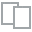
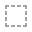
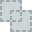
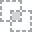
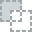
...
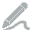
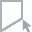
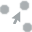
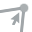
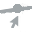

In [10]:
from dataprep.eda import create_report

create_report(ant_df)

### Correlation Matrix

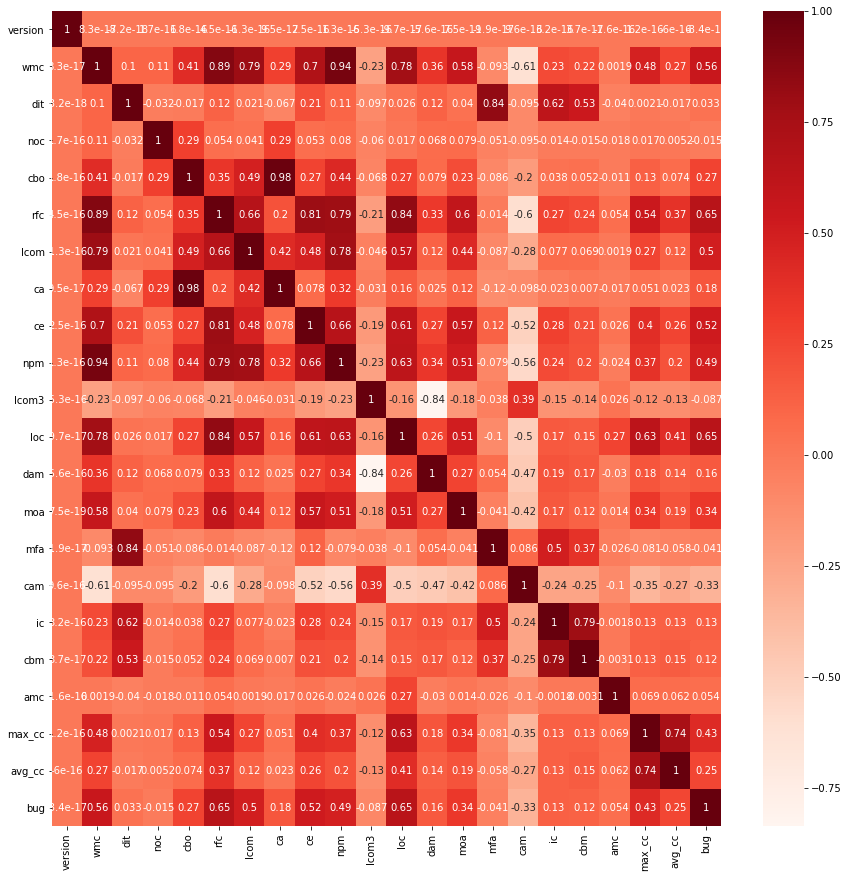

In [10]:
#Using Pearson Correlation
plt.figure(figsize=(15,15))
cor = ant_df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

### Target Frequency

<AxesSubplot:xlabel='bug', ylabel='count'>

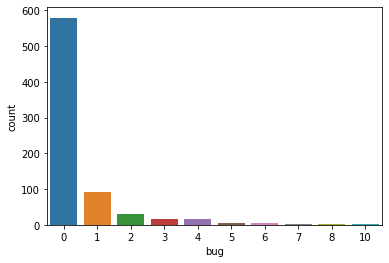

In [11]:
sns.countplot(x = 'bug', data = ant_df)

## Data Cleaning

### Drop unnecessary Columns

In [7]:
ant_df = ant_df.drop(columns = ['name', 'version', 'name.1'], axis = 1)

### Check Missing Values

In [8]:
def check_missing(df):
    df.isnull().sum()
    missing_count = df.isnull().sum() # the count of missing values
    value_count = df.isnull().count() # the count of all values 
    missing_percentage = round(missing_count / value_count * 100, 1) #the percentage of missing values
    missing_df = pd.DataFrame({'count': missing_count, 'percentage': missing_percentage}) #create a dataframe
    return missing_df

In [9]:
check_missing(ant_df)

,count,percentage
wmc,0,0.0
dit,0,0.0
noc,0,0.0
cbo,0,0.0
rfc,0,0.0
lcom,0,0.0
ca,0,0.0
ce,0,0.0
npm,0,0.0
lcom3,0,0.0


### Clean from NaN and Null Values

In [10]:
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

In [11]:
clean_dataset(ant_df)

,wmc,dit,noc,cbo,rfc,lcom,ca,ce,npm,lcom3,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,3.0,1.0,0.0,10.0,18.0,3.0,1.0,9.0,1.0,1.100000,...,0.000000,0.0,0.000000,0.444444,0.0,0.0,32.666667,1.0,0.6667,0.0
1,5.0,2.0,0.0,4.0,13.0,0.0,1.0,4.0,4.0,0.625000,...,1.000000,1.0,0.700000,0.500000,0.0,0.0,13.400000,1.0,0.6000,0.0
2,1.0,2.0,0.0,1.0,3.0,0.0,0.0,1.0,1.0,2.000000,...,0.000000,0.0,1.000000,1.000000,0.0,0.0,6.000000,0.0,0.0000,0.0
3,8.0,1.0,9.0,13.0,20.0,12.0,9.0,4.0,8.0,0.800000,...,0.200000,1.0,0.000000,0.406250,0.0,0.0,11.000000,1.0,0.8750,0.0
4,9.0,3.0,0.0,5.0,26.0,16.0,0.0,5.0,7.0,0.750000,...,1.000000,0.0,0.800000,0.388889,0.0,0.0,19.000000,2.0,1.0000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
740,92.0,3.0,0.0,34.0,261.0,3726.0,8.0,34.0,81.0,0.960246,...,0.970588,11.0,0.291339,0.112476,2.0,2.0,28.021739,15.0,1.5543,4.0
741,6.0,3.0,6.0,10.0,10.0,3.0,7.0,3.0,6.0,0.400000,...,1.000000,0.0,0.857143,0.500000,0.0,0.0,6.500000,3.0,1.5000,0.0
742,7.0,3.0,5.0,9.0,26.0,0.0,5.0,4.0,6.0,0.000000,...,1.000000,0.0,0.857143,0.314286,1.0,3.0,19.000000,3.0,1.5714,0.0
743,5.0,2.0,0.0,8.0,34.0,8.0,1.0,7.0,3.0,0.500000,...,1.000000,0.0,0.884615,1.000000,0.0,0.0,42.000000,11.0,3.4000,1.0


### Convert Target to Binary

In [12]:
ant_df['bug'] = ant_df['bug'].map(
                   {0:0 , 1:1, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1 })

In [35]:
def convert_target_binary(df):
    df['bug'] = df['bug'].map(
                       {0:0 , 1:1, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1 })

convert_target_binary(ant_df)

### Visualize Cleaned Data

In [ ]:
ant_df

## Data Split

In [16]:
# set target
target = 'bug'

In [17]:
# set all columns other than the target for X
X = ant_df.loc[:, ant_df.columns!=target]
y = ant_df.loc[:, ant_df.columns==target]

In [18]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = 50 )

In [19]:
print('Training Set: ', X_train.shape[0])
print('Testing Set: ', X_test.shape[0])

Training Set:  558
Testing Set:  187


## Feature Selection

For this dataset, there is no need to remove constant and quasi constant features as we are dealing with software metrics.

### Remove Correlated Features

#### Visualize Correlation Matrix

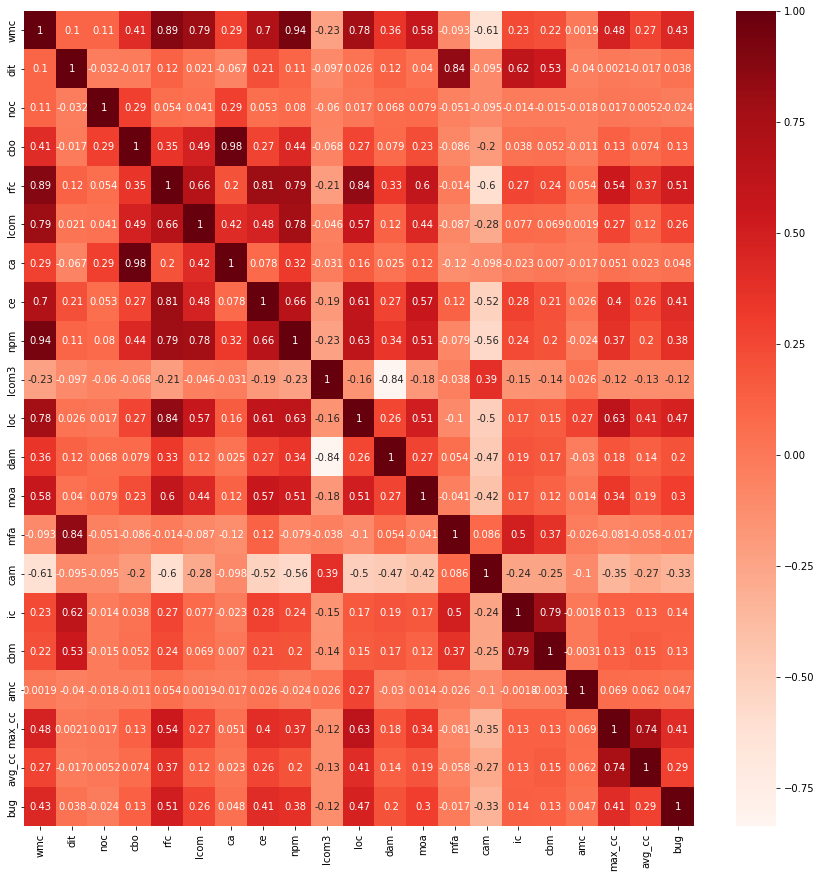

In [20]:
#Using Pearson Correlation
plt.figure(figsize=(15,15))
cor = ant_df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

#### Find Highly Correlated Features
The threshold can be tuned based on the data

In [39]:
#Correlation with output variable
cor_target = abs(cor["bug"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.4]
relevant_features

wmc       0.433436
rfc       0.510690
ce        0.410585
loc       0.473067
max_cc    0.408716
bug       1.000000
Name: bug, dtype: float64

#### Drop Correlated Features

In [39]:
X_train.drop(labels = correlated_features, axis = 1, inplace = True)
X_test.drop(labels = correlated_features, axis = 1, inplace = True)

KeyError: "['npm' 'loc' 'ca' 'dam' 'rfc' 'ce' 'mfa'] not found in axis"

In [40]:
X_train

,wmc,dit,noc,cbo,lcom,lcom3,moa,cam,ic,cbm,amc,max_cc,avg_cc
253,1,1,0,7,0,2.000000,0,1.000000,0,0,0.000000,1,1.0000
248,4,4,0,4,0,0.000000,0,0.500000,1,1,7.250000,2,1.0000
166,14,1,0,30,87,0.884615,2,0.192308,0,0,63.500000,10,1.7143
368,2,4,0,2,1,2.000000,0,0.750000,1,1,5.000000,1,0.5000
159,8,1,2,5,6,0.678571,0,0.625000,0,0,21.125000,4,1.8750
...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,4,4,0,4,0,0.000000,0,0.750000,2,4,20.500000,1,0.5000
289,6,1,0,4,3,0.750000,1,0.533333,0,0,10.000000,1,0.6667
109,7,1,0,15,5,0.444444,2,0.523810,0,0,19.714286,3,1.1429
480,4,1,0,6,0,0.333333,1,0.500000,0,0,23.500000,3,1.2500


### Fisher Feature Selection

In [47]:
from sklearn.feature_selection import SelectKBest, chi2

In [48]:
# select 10 features with highest chi-squared statistics
chi2_selector = SelectKBest(chi2, k=10)
X_kbest = chi2_selector.fit_transform(X, y)

In [49]:
# View results
print('Original number of features:', X.shape[1])
print('Reduced number of features:', X_kbest.shape[1])

Original number of features: 20
Reduced number of features: 10


In [40]:
! pip install mlxtend

## Preprocessing and Training Pipeline

In [41]:
! pip install imblearn

  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.23.2
    Uninstalling scikit-learn-0.23.2:
      Successfully uninstalled scikit-learn-0.23.2


In [46]:
from imblearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model  import LogisticRegression
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures

### TODO: Data Resampling (Oversampling and Undersampling)